In [9]:
import sys
print(sys.executable)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\python.exe


In [11]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

Matplotlib is building the font cache; this may take a moment.


In [14]:
!pip install statsmodels


     ---------------------------------------- 0.0/20.5 MB ? eta -:--:--
     ---------------------------------------- 0.0/20.5 MB ? eta -:--:--
      --------------------------------------- 0.3/20.5 MB ? eta -:--:--
     - -------------------------------------- 0.5/20.5 MB 2.0 MB/s eta 0:00:11
     -- ------------------------------------- 1.0/20.5 MB 1.9 MB/s eta 0:00:11
     --- ------------------------------------ 1.6/20.5 MB 2.3 MB/s eta 0:00:09
     ----- ---------------------------------- 2.6/20.5 MB 2.8 MB/s eta 0:00:07
     ------ --------------------------------- 3.4/20.5 MB 3.0 MB/s eta 0:00:06
     -------- ------------------------------- 4.5/20.5 MB 3.3 MB/s eta 0:00:05
     ---------- ----------------------------- 5.2/20.5 MB 3.4 MB/s eta 0:00:05
     ----------- ---------------------------- 6.0/20.5 MB 3.5 MB/s eta 0:00:05
     -------------- ------------------------- 7.3/20.5 MB 3.7 MB/s eta 0:00:04
     ---------------- ----------------------- 8.4/20.5 MB 3.8 MB/s eta 0:


[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [16]:
class BaseLift(object):
    
    def __init__(self, past_sales, past_promotions=[], alpha=None):
        
        from statsmodels.tsa.holtwinters import SimpleExpSmoothing
        from numpy import cumsum
        
        self.past_sales = past_sales
        self.last_index = len(self.past_sales) - 1
        
        # promotions
        if past_promotions == []:
            self.past_promotions = [0 for _ in range(len(past_sales))]
        else:
            if len(past_promotions) != len(past_sales):
                raise Exception("len(past_promotions) != len(past_sales)")
            self.past_promotions = past_promotions
        
        # alpha
        self.alpha = alpha
        
        # adjust model
        self.model = SimpleExpSmoothing(past_sales)
        if alpha:
            fit = self.model.fit(smoothing_level=alpha, optimized=False)
        else:
            fit = self.model.fit(optimized=True)
        self.params = fit.params
        
        # calculate lift
        if sum(self.past_promotions) > 0:
            base_predictions = self.model.predict(self.params, start=0, end=len(past_sales))
            last_promotion_index = cumsum(self.past_promotions).argmax()
            lift = self.past_sales[last_promotion_index] - base_predictions[last_promotion_index]
        else:
            lift = 1
        
        self.lift = lift
        
      
    def predict(self, n_periods, next_promotions = []): 
        
        base_predictions = self.model.predict(self.params, start=self.last_index, end=self.last_index+n_periods-1)
        
        if next_promotions != []:
            if len(next_promotions) != n_periods:
                raise Exception("len(next_promotions) != n_periods")

            predictions = [(pred + self.lift if promo else pred) for pred, promo in zip(base_predictions, next_promotions)]
        else:
            predictions = base_predictions.tolist()
        
        return predictions

    
    def predict2(self, n_periods, next_promotions = []): 
        
        base_predictions = self.model.predict(self.params, start=self.last_index, end=self.last_index+n_periods-1)
        
        past_sales = self.past_sales
        for i in range(n_periods):
            model = SimpleExpSmoothing(past_sales)
        
            if self.alpha:
                fit = self.model.fit(smoothing_level=self.alpha, optimized=False)
            else:
                fit = self.model.fit(optimized=True)
            self.params = fit.params
            
            
        if next_promotions != []:
            if len(next_promotions) != n_periods:
                raise Exception("len(next_promotions) != n_periods")

            predictions = [(pred + self.lift if promo else pred) for pred, promo in zip(base_predictions, next_promotions)]
        else:
            predictions = base_predictions.tolist()
        
        return predictions

In [3]:
import pandas as pd

dataset = pd.read_csv("../data/calculated_features/lagged_features_2.csv", header=[0,1])


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\266205040.py:3: DtypeWarning: Columns (9158,9159,9160,9161,9162,9163,9164,9165,9166,9167,9168,9169,9171,9172,9173,9174,9175,9176,9177,9178,9179,9180,9181,9182,9183,9184,9185,9186,9187,9188,9189,9190,9191,9192,9193,9194,9195,9196,9197,9198,9199,9200,9201,9202,9203,9204,9205,9206,9207,9208,9209,9210,9211,9212,9213,9214,9215,9216,9217,9218,9219,9220,9221,9222,9223,9225,9226,9227,9228,9229,9230,9231,9232,9233,9234,9235,9236,9237,9238,9239,9240,9241,9242,9243,9244,9245,9246,9247,9248,9249,9250,9251,9252,9253,9254,9255,9256,9257,9259,9260,9261,9262,9263,9264,9265,9266,9267,9268,9269,9271,9272,9273,9274,9275,9276,9277,9278,9279,9280,9281,9282,9283,9284,9285,9286,9287,9288,9289,9291,9292,9293,9294,9295,9296,9297,9298,9299,9300,9303,9304,9305,9306,9307,9308,9309,9310,9311,9312,9313,9314,9315,9316,9317,9318,9319,9320,9321,9322,9323,9324,9325,9326,9327,9328,9329,9330,9331,9334,9335,9336,9337,9338,9339,9340,9341,9342,9343,9344,9345,9346,9347,93

In [17]:
import numpy as np

# Automatically detect the correct store_nbr column
store_col = [col for col in dataset.columns if col[0] == "store_nbr"][0]
print(f"Detected store column: {store_col}")

validation_periods = 8
error_list = []
smape_list = []

df_total_results = pd.DataFrame()

# Loop through each unique store number
for store_nbr in dataset[store_col].unique():
    print(f"Processing store {store_nbr}", end='\r')

    # Extract data for that specific store
    store_dataset = dataset[dataset[store_col] == store_nbr]["unit_sales_corrected"]
    store_promotions_dataset = dataset[dataset[store_col] == store_nbr]["onpromotion_lag_0"]

    # Clean column names for promotions
    store_promotions_dataset.columns = [l.split("_")[0] for l in store_promotions_dataset.columns]
    
    n_products = len(store_dataset.columns)

    # Loop through each product in that store
    for idx_prod, item_nbr in enumerate(store_dataset.columns):
        print(f"Processing store {store_nbr} product {idx_prod}", end='\r')
        
        # Prepare target and promotions
        target = np.expm1(store_dataset[[item_nbr]].rename(columns={item_nbr: "target"}))
        promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
        
        target = target.values.flatten().tolist()
        promotions = promotions.values.flatten().tolist()

        # Train-test split
        target_train = target[:-validation_periods]
        target_test = target[-validation_periods:]
        promotions_train = promotions[:-validation_periods]
        promotions_test = promotions[-validation_periods:]
        
        # Initialize BaseLift model
        model = BaseLift(target_train, promotions_train, alpha=0.01)
        
        # Predict for validation period
        predictions = model.predict(n_periods=validation_periods, next_promotions=promotions_test)
        
        # Store results in a DataFrame
        df_results = pd.DataFrame({
            "actual": target_test,
            "adj_prediction": predictions,
            "horizon": list(range(1, validation_periods + 1)),
            "item_nbr": item_nbr,
            "store_nbr": store_nbr,
            "promotion": promotions_test
        })
        
        # Append using concat (append is deprecated)
        df_total_results = pd.concat([df_total_results, df_results], ignore_index=True)
        
# Save final results
df_total_results.to_csv("benchmark_results.csv", index=False)
print("\n✅ Processing complete. Results saved to benchmark_results.csv.")


Detected store column: ('store_nbr', 'Unnamed: 1_level_1')


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipy

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipy

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipy

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipy

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipy

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWa

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:\Users\Maheswari\AppData\Local\Temp\ipykernel_39744\3738609900.py:32: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  promotions = store_promotions_dataset[[item_nbr]].rename(columns={item_nbr: "promotions"}).replace("False", False).replace("True", True).astype(int)
C:

c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1380: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:1387: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
c:\Users\Maheswari\AppData\Local\Programs\Python\Python314\Lib\site-packages\sta

Processing store 54 product 1622
✅ Processing complete. Results saved to benchmark_results.csv.


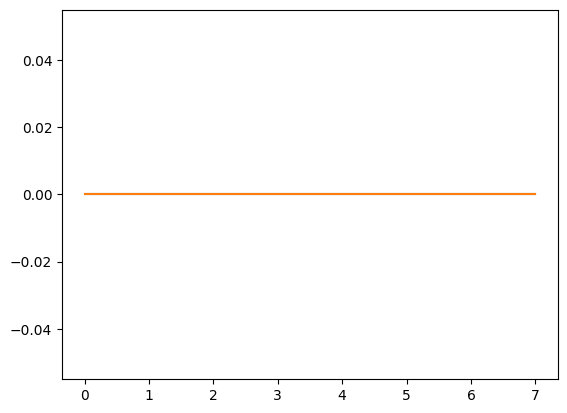

In [19]:
import matplotlib.pyplot as plt

plt.plot(target_test)
plt.plot(predictions)

<Axes: xlabel='actual', ylabel='adj_prediction'>

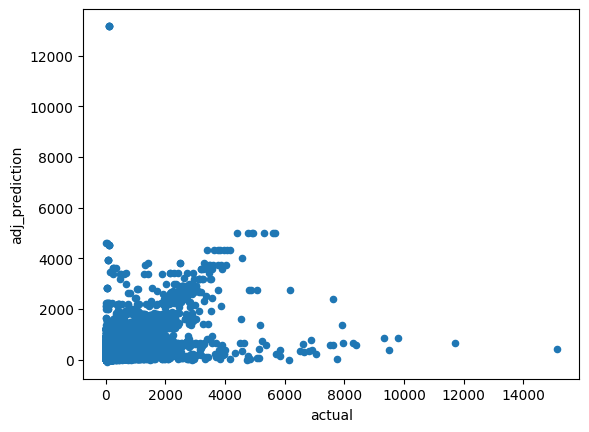

In [20]:
df_total_results[["actual", "adj_prediction"]].plot.scatter(x="actual", y="adj_prediction")

In [21]:
abs(df_total_results["actual"] - df_total_results["adj_prediction"]).mean()

np.float64(24.80519699185326)

In [22]:
df_total_results[df_total_results.promotion==1]

,actual,adj_prediction,horizon,item_nbr,store_nbr,promotion
32,13.692307,14.820513,1,108696,1,1
34,8.000000,14.842247,3,108696,1,1
35,12.000000,14.842247,4,108696,1,1
37,12.000000,14.842247,6,108696,1,1
38,11.000000,14.842247,7,108696,1,1
...,...,...,...,...,...,...
701107,396.000000,313.341700,4,1960892,54,1
701108,352.000000,313.341700,5,1960892,54,1
701109,371.000000,313.341700,6,1960892,54,1
701110,355.000000,313.341700,7,1960892,54,1


<Axes: >

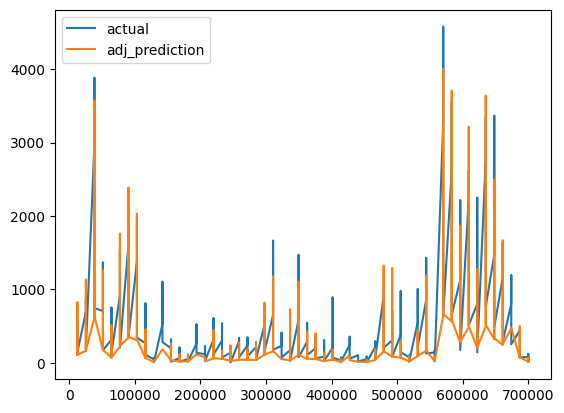

In [23]:
df_total_results[df_total_results.item_nbr == '2042941'][["actual", "adj_prediction"]].plot()

In [24]:
df_sample = df_total_results[df_total_results.item_nbr == '105574']
abs(df_sample["actual"] - df_sample["adj_prediction"]).mean()

np.float64(15.399737780289477)

In [25]:
store_dataset.columns.__len__()

1623